# Getting Started with `feems` - wolves data set

Running an analysis on data set in [Schweizer et al. 2015](https://onlinelibrary.wiley.com/doi/full/10.1111/mec.13364?casa_token=idW0quVPOU0AAAAA%3Ao_ll85b8rDbnW3GtgVeeBUB4oDepm9hQW3Y445HI84LC5itXsiH9dGO-QYGPMsuz0b_7eNkRp8Mf6tlW), similar to analyses in other notebooks...

In [98]:
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
from datetime import date
import pkg_resources
from sklearn.impute import SimpleImputer
from pandas_plink import read_plink
from copy import deepcopy
import itertools as it
import statsmodels.api as sm
from scipy.stats.distributions import chi2

# viz
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import seaborn as sns
import plotly.express as px

# feems
from feems.utils import prepare_graph_inputs
from feems.spatial_graph import query_node_attributes
from feems import SpatialGraph, Viz, Objective
from feems.cross_validation import run_cv, comp_mats
from feems.helper_funcs import cov_to_dist, comp_genetic_vs_fitted_distance, plot_default_vs_long_range

# change matplotlib fonts
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.sans-serif"] = "Arial"

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Note we have packaged this example dataset in the `feems` package and use the `pkg_resources` package to find the path of those files:

In [2]:
data_path = pkg_resources.resource_filename("feems", "data/")

Next we read the `plink` formatted genotype data and impute any missing SNPs with the mean at each SNP:

In [3]:
# read the genotype data and mean impute missing data
(bim, fam, G) = read_plink("{}/wolvesadmix".format(data_path))
imp = SimpleImputer(missing_values=np.nan, strategy="mean")
genotypes = imp.fit_transform((np.array(G)).T)

print("n_samples={}, n_snps={}".format(genotypes.shape[0], genotypes.shape[1]))

Mapping files: 100%|██████████| 3/3 [00:00<00:00, 37.95it/s]
n_samples=111, n_snps=17729


In [15]:
%%time
# setup graph
coord = np.loadtxt("{}/wolvesadmix.coord".format(data_path))  # sample coordinates
outer = np.loadtxt("{}/wolvesadmix.outer".format(data_path))  # outer coordinates
grid_path = "{}/grid_100.shp".format(data_path)  # path to discrete global grid

# graph input files
outer, edges, grid, _ = prepare_graph_inputs(coord=coord, 
                                             ggrid=grid_path,
                                             translated=True, 
                                             buffer=0,
                                             outer=outer)

CPU times: user 5.75 s, sys: 58.5 ms, total: 5.81 s
Wall time: 5.84 s


In [5]:
grid[:5, ]

array([[-166.637,   59.732],
       [-166.585,   60.675],
       [-166.529,   61.623],
       [-168.75 ,   62.088],
       [-166.467,   62.576]])

In [16]:
%%time
wolves_graph = SpatialGraph(genotypes, coord, grid, edges)

CPU times: user 2min 4s, sys: 2.62 s, total: 2min 7s
Wall time: 2min 9s


In [7]:
projection = ccrs.EquidistantConic(central_longitude=-108.842926, central_latitude=66.037547)   

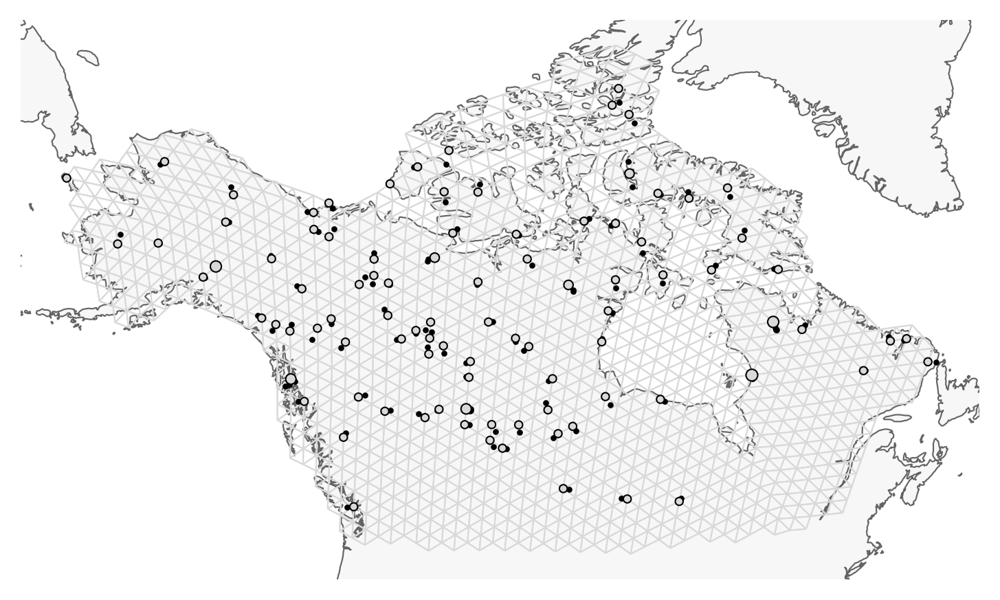

In [17]:
fig = plt.figure(dpi=300)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, 
        edge_alpha=1, edge_zorder=100, sample_pt_size=10, 
        obs_node_size=7.5, sample_pt_color="black", 
        cbar_font_size=10)
v.draw_map()
v.draw_samples()
v.draw_edges(use_weights=False)
v.draw_obs_nodes(use_ids=False)

In [18]:
%%time
wolves_graph.fit(lamb = 0.8)

constant-w/variance fit, converged in 132 iterations, train_loss=2795677.6520805
lambda=0.80000, alpha=0.83543, beta=0.00000, converged in 94 iterations, train_loss=2761323.98444
CPU times: user 7.45 s, sys: 330 ms, total: 7.78 s
Wall time: 2.52 s


Now we can visualize the weighted graph:

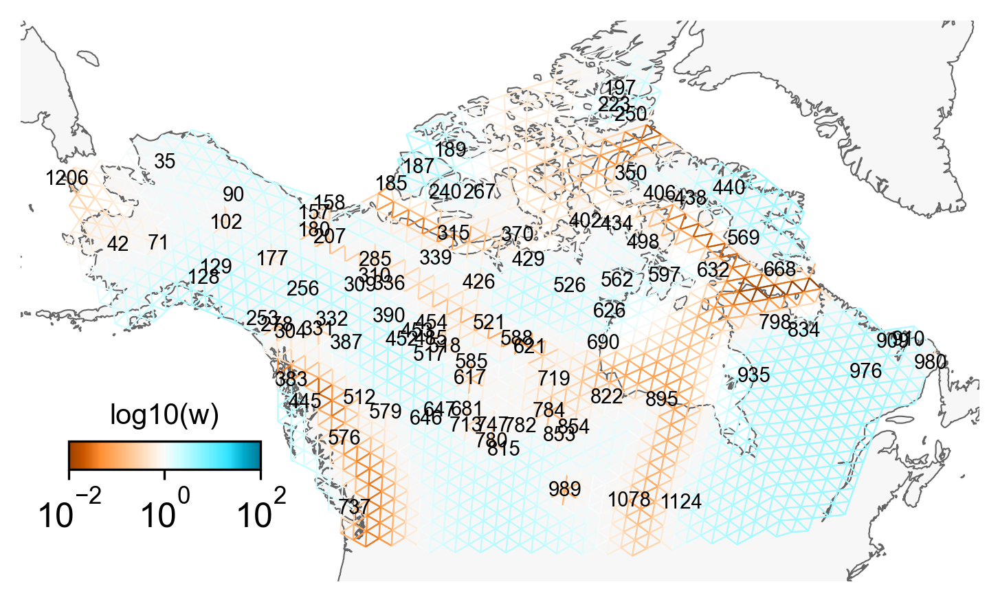

In [61]:
fig = plt.figure(dpi=300)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, 
        edge_alpha=1, edge_zorder=100, sample_pt_size=20, 
        obs_node_size=7.5, sample_pt_color="black", 
        cbar_font_size=10)
v.draw_map()
v.draw_edges(use_weights=True)
v.draw_obs_nodes(use_ids=True) 
v.draw_edge_colorbar()

## Running residual analysis on the wolves data

[(16, 18), (43, 68), (11, 13)]

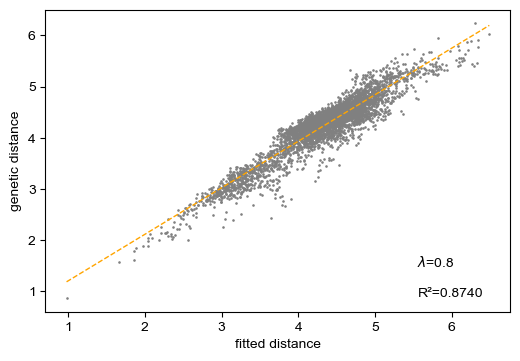

In [21]:
# there are no distinct outliers, but will see which nodes get returned as having the highest residuals
comp_genetic_vs_fitted_distance(wolves_graph, lamb=0.8, plotFig=True)

In [23]:
%%time
max_res_nodes = comp_genetic_vs_fitted_distance(wolves_graph, lamb=0.8, plotFig=False, n_lre=10)

CPU times: user 118 ms, sys: 28.6 ms, total: 146 ms
Wall time: 43.3 ms


In [24]:
# looks like nodes around 11, 17, 42, 56, 67 are in the mix (ignoring nodes that are within the same 'population' group)
max_res_nodes

[(16, 18),
 (43, 68),
 (11, 13),
 (42, 68),
 (42, 56),
 (13, 16),
 (18, 37),
 (13, 18),
 (11, 17),
 (56, 68)]

In [27]:
# only look for nodes that are representative of sampled populations...
permuted_idx = query_node_attributes(wolves_graph, "permuted_idx")
obs_perm_ids = permuted_idx[: wolves_graph.n_observed_nodes]
obs_grid = grid[obs_perm_ids, :]

In [62]:
node_to_pop

,nodes,pops
0,35,[105]
1,42,[106]
2,71,[108]
3,90,[107]
4,102,[104]
...,...,...
89,980,[39]
90,989,[52]
91,1078,[0]
92,1124,[1]


In [38]:
## code for mapping nodes back to populations (since multiple pops can be assigned to the same nodes)
node_to_pop = pd.DataFrame(index = np.arange(wolves_graph.n_observed_nodes), columns = ['nodes', 'pops'])
node_to_pop['nodes'] = obs_perm_ids
node_to_pop['pops'] = [query_node_attributes(wolves_graph,"sample_idx")[x] for x in obs_perm_ids]

In [157]:
lrn

[(223, 250),
 (440, 668),
 (185, 189),
 (438, 668),
 (438, 569),
 (189, 223),
 (250, 402),
 (189, 250),
 (185, 240),
 (569, 668)]

In [43]:
lrn = list(map(tuple,node_to_pop['nodes'][np.ravel(max_res_nodes)[0:20]].values.reshape(10,2)))
edges_lr = deepcopy(edges)
edges_lr = edges_lr.tolist()
for x in lrn:
    edges_lr.append(list(tuple(y+1 for y in x)))
wolves_graph_lr = SpatialGraph(genotypes, coord, grid, np.array(edges_lr), long_range_edges=lrn)

In [69]:
# lamb_grid = np.geomspace(1e-6, 2e2, 20)[::-1]
# cv_err = run_cv(wolves_graph_lr, lamb_grid, n_folds=20, factr=1e10)
# mean_cv_err = np.mean(cv_err, axis=0)
# lamb_cv = float(lamb_grid[np.argmin(mean_cv_err)])

wolves_graph_lr.fit(lamb = 1.1)

constant-w/variance fit, converged in 129 iterations, train_loss=2794593.5316744
lambda=1.10000, alpha=0.90605, beta=0.00000, converged in 7 iterations, train_loss=2770500.00095


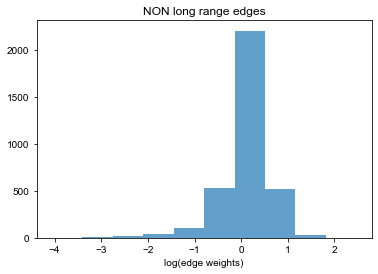

Text(0.5, 0, 'log(edge weights)')

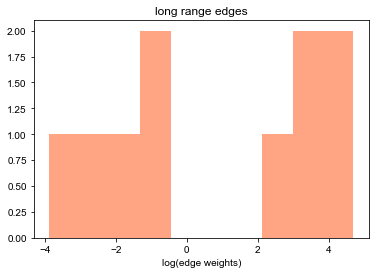

In [123]:
plt.hist(np.log(wolves_graph_lr.w[~wolves_graph_lr.lre_idx]),alpha=0.7)
plt.title('NON long range edges')
plt.xlabel('log(edge weights)')
plt.show()
plt.hist(np.log(wolves_graph_lr.w[wolves_graph_lr.lre_idx]),color='coral',alpha=0.7)
plt.title('long range edges')
plt.xlabel('log(edge weights)')

In [148]:
nll = np.empty(10)
edges_lr = deepcopy(edges)
edges_lr = edges_lr.tolist()
for idx in np.arange(len(nll)):
    for x in node_to_pop['nodes'][np.ravel(max_res_nodes)[idx*2:((idx+1)*2)]].values.reshape(1,2):
        #print([(x[0],x[1])])        
        edges_lr.append(list(tuple(y+1 for y in x)))    
    wolves_graph_lr = SpatialGraph(genotypes, coord, grid, np.array(edges_lr))
    wolves_graph_lr.fit(lamb=1.1)
    obj_lr = Objective(wolves_graph_lr)
    obj_lr.inv()
    nll[idx] = obj_lr.neg_log_lik()

constant-w/variance fit, converged in 132 iterations, train_loss=2795677.6520805
lambda=1.10000, alpha=0.83543, beta=0.00000, converged in 134 iterations, train_loss=2763183.06314
constant-w/variance fit, converged in 126 iterations, train_loss=2795393.8986943
lambda=1.10000, alpha=0.85077, beta=0.00000, converged in 149 iterations, train_loss=2762858.52768
constant-w/variance fit, converged in 120 iterations, train_loss=2794913.0507943
lambda=1.10000, alpha=0.86289, beta=0.00000, converged in 110 iterations, train_loss=2762693.90620
constant-w/variance fit, converged in 120 iterations, train_loss=2794718.7765333
lambda=1.10000, alpha=0.87430, beta=0.00000, converged in 103 iterations, train_loss=2762594.11094
constant-w/variance fit, converged in 125 iterations, train_loss=2794481.9842720
lambda=1.10000, alpha=0.87957, beta=0.00000, converged in 111 iterations, train_loss=2762415.87574
constant-w/variance fit, converged in 131 iterations, train_loss=2794480.5944827
lambda=1.10000, alp

Text(0.5, 0, 'number of edges')

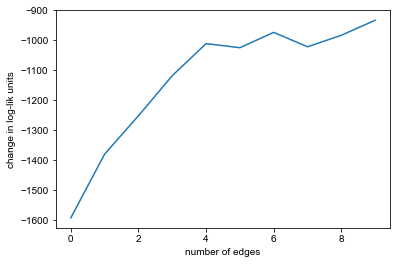

In [170]:
plt.plot(np.arange(0,10),obj.neg_log_lik()-nll[0:10],'-')
plt.ylabel('change in log-lik units')
plt.xlabel('number of edges')

In [174]:
# print(nll[0])
# print(obj.neg_log_lik())
-2.*(nll[0]-obj.neg_log_lik())

-3183.486248485744

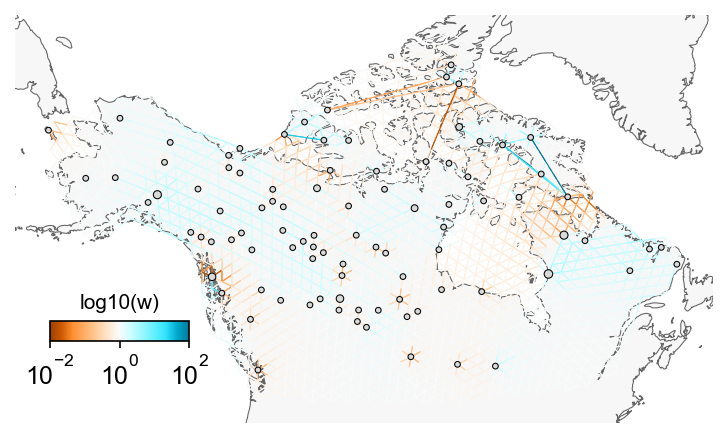

In [73]:
fig = plt.figure(dpi=150)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph_lr, projection=projection, edge_width=.5, 
        edge_alpha=1, edge_zorder=100, sample_pt_size=20, 
        obs_node_size=7.5, sample_pt_color="black", 
        cbar_font_size=10)
v.draw_map()
v.draw_edges(use_weights=True)
v.draw_obs_nodes(use_ids=False) 
v.draw_edge_colorbar()

[(89, 93), (16, 18), (87, 93)]

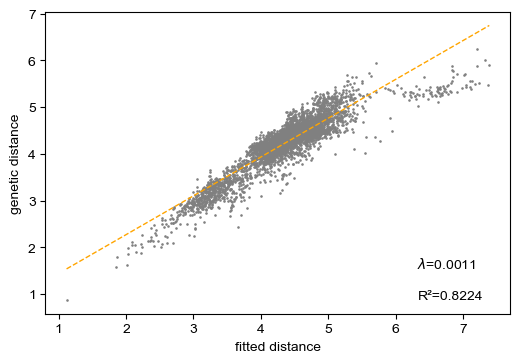

In [120]:
comp_genetic_vs_fitted_distance(wolves_graph_lr, lamb=1.1, plotFig=True)

In [74]:
# Plot Observed vs Fitted Covariances and residuals
obj = Objective(wolves_graph)
fit_cov, _, emp_cov = comp_mats(obj)
# Set diagonals to zero to focus on covariances
np.fill_diagonal(fit_cov,0)
np.fill_diagonal(emp_cov,0)

In [91]:
res_mat = fit_cov - emp_cov
# res_mat[np.tril_indices_from(res_mat,k=-1)]

In [104]:
px.imshow(res_mat)

(array([   4.,    5.,   10.,   44.,  364., 1472., 2212.,  225.,   28.,
           7.]),
 array([-1.30362968, -1.08128991, -0.85895014, -0.63661037, -0.4142706 ,
        -0.19193083,  0.03040894,  0.25274871,  0.47508848,  0.69742825,
         0.91976802]),
 <a list of 10 Patch objects>)

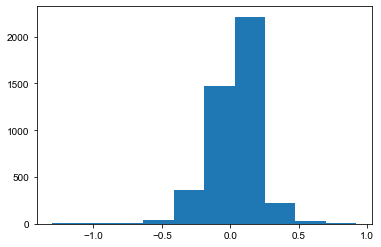

In [83]:
fit_dist = cov_to_dist(fit_cov)[np.tril_indices(wolves_graph.n_observed_nodes, k=-1)]
emp_dist = cov_to_dist(emp_cov)[np.tril_indices(wolves_graph.n_observed_nodes, k=-1)]

# using code from supp fig 6 of feems-analysis
X = sm.add_constant(fit_dist)
mod = sm.OLS(emp_dist, X)
res = mod.fit()

plt.hist(res.resid - res_mat[np.tril_indices_from(res_mat,k=-1)])

Text(0, 0.5, 'diff bw matrices of fitted and empirical covariances')

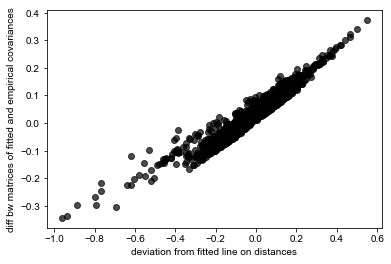

In [114]:
plt.scatter(res.resid, res_mat[np.tril_indices_from(res_mat,k=-1)], color='k', alpha=0.7)
plt.xlabel('deviation from fitted line on distances')
plt.ylabel('diff bw matrices of fitted and empirical covariances')
# plt.axline((0,0),(-1,-1),color='red',ls='--')

In [118]:
print(res.resid[np.argsort(res.resid)])
res_mat[np.tril_indices_from(res_mat,k=-1)][np.argsort(res_mat[np.tril_indices_from(res_mat,k=-1)])]

[-0.96035102 -0.93605697 -0.88702905 ...  0.46714942  0.49768303
  0.54776522]


array([-0.34327867, -0.33708365, -0.30283848, ...,  0.32309702,
        0.34113422,  0.3720028 ])

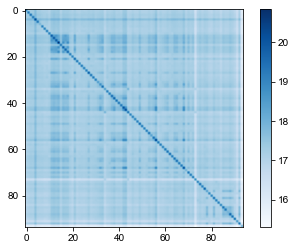

In [122]:
plt.imshow(wolves_graph.S, cmap='Blues')
plt.colorbar()

### Regularization path analysis

In [124]:
betas = np.logspace(-2,5,base=np.exp(1),num=20) # -0.01 to 400
metricsdf2 = pd.DataFrame(index=range(len(betas)),columns=["loss","log_lik","pen1","pen2"])
metricsdf = deepcopy(metricsdf2)
metricsdf2['betas'] = betas
for n in np.arange(5):
    for ib, b in enumerate(betas):
        wolves_graph_lr.fit(lamb=1.1, beta=b)
        metricsdf2.loc[ib,"loss"] = wolves_graph_lr.train_loss
        obj_lr = Objective(wolves_graph_lr)
        obj_lr.lamb = 1.1
        obj_lr.alpha = 1/wolves_graph_lr.w0.mean()
        obj_lr.beta = b
        obj_lr.inv() 
        metricsdf2.loc[ib,"log_lik"] = -obj_lr.neg_log_lik()
        obj_lr.loss()
        metricsdf2.loc[ib,"pen1"] = obj_lr.pen1
        metricsdf2.loc[ib,"pen2"] = obj_lr.pen2#b * np.sum(sp_graph_lr.w[sp_graph_lr.lre_idx])

    print(metricsdf2)
    metricsdf = metricsdf + metricsdf2

onverged in 129 iterations, train_loss=2794593.5316744
lambda=1.10000, alpha=0.90605, beta=5.38820, converged in 39 iterations, train_loss=2762607.20208
constant-w/variance fit, converged in 129 iterations, train_loss=2794593.5316744
lambda=1.10000, alpha=0.90605, beta=7.78837, converged in 47 iterations, train_loss=2762465.27771
constant-w/variance fit, converged in 129 iterations, train_loss=2794593.5316744
lambda=1.10000, alpha=0.90605, beta=11.25770, converged in 52 iterations, train_loss=2762459.94861
constant-w/variance fit, converged in 129 iterations, train_loss=2794593.5316744
lambda=1.10000, alpha=0.90605, beta=16.27245, converged in 64 iterations, train_loss=2762508.10069
constant-w/variance fit, converged in 129 iterations, train_loss=2794593.5316744
lambda=1.10000, alpha=0.90605, beta=23.52103, converged in 65 iterations, train_loss=2762614.89163
constant-w/variance fit, converged in 129 iterations, train_loss=2794593.5316744
lambda=1.10000, alpha=0.90605, beta=33.99848, c

KeyboardInterrupt: 

[]

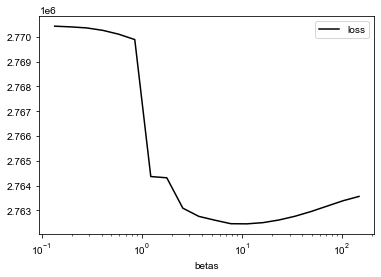

In [129]:
metricsdf2.plot(x='betas',y=["log_lik","pen1","pen2"],kind='line')
plt.ylabel('units')
plt.loglog()
metricsdf2.plot(x='betas',y=["log_lik"],kind='line')
plt.semilogx()
metricsdf2.plot(x='betas',y=['pen1'],kind='line',color='orange')
plt.semilogx()
metricsdf2.plot(x='betas',y='loss',color='black')
plt.semilogx()

Text(0, 0.5, 'sum of long range weights')

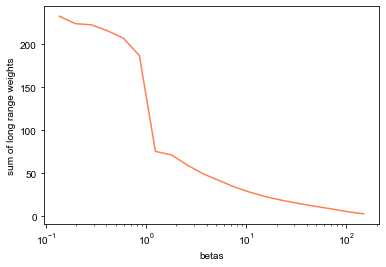

In [128]:
plt.plot(metricsdf2['betas'],metricsdf2['pen2']/metricsdf2['betas'],color='coral')
plt.xlabel('betas')
plt.semilogx()
plt.ylabel('sum of long range weights')